# **Key Point Detection - 3**

## **Train Key Point Detection Model**

**using Tensorflow**

In [ ]:
!pip install tensorflow tensorflow-gpu opencv-python matplotlib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 588.3/588.3 MB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 578.1/578.1 MB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 578.1/578.1 MB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 511.8/511.8 MB 3.2 MB/s eta 0:00:00


In [ ]:
import os
import cv2
import tensorflow as tf
import cv2
import json
import numpy as np
from matplotlib import pyplot as plt

In [ ]:
# Avoid OOM errors by setting GPU Memory Consumption Growth
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus: 
    tf.config.experimental.set_memory_growth(gpu, True)

In [ ]:
gpus

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

#### Load Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive/KeyPoint

/content/drive/MyDrive/KeyPoint


In [ ]:
!ls

data		     IrisEstimation.ipynb     Trainning.ipynb
data_creation.ipynb  Test_Augmentation.ipynb


In [ ]:
def load_image(x): 
    byte_img = tf.io.read_file(x)
    img = tf.io.decode_jpeg(byte_img)
    return img

In [ ]:
train_images = tf.data.Dataset.list_files('/content/drive/MyDrive/KeyPoint/data/aug4/images/*.jpg', shuffle=False)
train_images = train_images.map(load_image)  # map -- > do same for every image
train_images = train_images.map(lambda x: tf.image.resize(x, (250,250)))
train_images = train_images.map(lambda x: x/255)

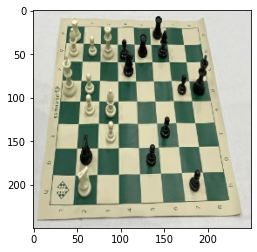

In [ ]:
plt.imshow(train_images.as_numpy_iterator().next());

In [ ]:
test_images = tf.data.Dataset.list_files('/content/drive/MyDrive/KeyPoint/data/aug4/images/*.jpg', shuffle=False)
test_images = test_images.map(load_image)
test_images = test_images.map(lambda x: tf.image.resize(x, (250,250)))
test_images = test_images.map(lambda x: x/255)

In [ ]:
val_images = tf.data.Dataset.list_files('/content/drive/MyDrive/KeyPoint/data/aug4/images/*.jpg', shuffle=False)
val_images = val_images.map(load_image)
val_images = val_images.map(lambda x: tf.image.resize(x, (250,250)))
val_images = val_images.map(lambda x: x/255)

#### Prepare Labels

In [ ]:
def load_labels(label_path):
    with open(label_path.numpy(), 'r', encoding = "utf-8") as f:  #utf-- avoid any unnessary charactors
        label = json.load(f)
    return [label['keypoints']]

In [ ]:
train_labels = tf.data.Dataset.list_files('/content/drive/MyDrive/KeyPoint/data/aug4/labels/*.json', shuffle=False)
train_labels = train_labels.map(lambda x: tf.py_function(load_labels, [x], [tf.float16]))

In [ ]:
test_labels = tf.data.Dataset.list_files('/content/drive/MyDrive/KeyPoint/data/aug4/labels/*.json', shuffle=False)
test_labels = test_labels.map(lambda x: tf.py_function(load_labels, [x], [tf.float16]))

In [ ]:
val_labels = tf.data.Dataset.list_files('/content/drive/MyDrive/KeyPoint/data/aug4/labels/*.json', shuffle=False)
val_labels = val_labels.map(lambda x: tf.py_function(load_labels, [x], [tf.float16]))

In [ ]:
print(train_labels.as_numpy_iterator().next())

(array([0.159 , 0.0743, 0.7544, 0.0806, 0.0764, 0.894 , 0.9004, 0.8716],
      dtype=float16),)


#### Combine Labels and Images

In [ ]:
# 'LU', 'RU' ,'LD' ,'RD'
# input --> Image
# output --> Annotation

In [ ]:
# combine input and output
train = tf.data.Dataset.zip((train_images, train_labels))
train = train.shuffle(100)

## return 16 images as batch
# batch_size = 16
train = train.batch(16)  
train = train.prefetch(4)

In [ ]:
test = tf.data.Dataset.zip((test_images, test_labels))
test = test.shuffle(1300)
test = test.batch(16)
test = test.prefetch(4)

In [ ]:
val = tf.data.Dataset.zip((val_images, val_labels))
val = val.shuffle(1000)
val = val.batch(16)
val = val.prefetch(4)

#### View Samples

In [ ]:
# data iterator
data_samples = train.as_numpy_iterator()

In [ ]:
res = data_samples.next()
res[0].shape

(16, 250, 250, 3)

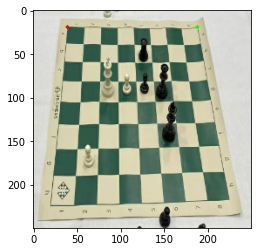

In [ ]:
plt.imshow(res[0][0])

In [ ]:
res[1][0][0]  # 1--> coordinate

array([0.158  , 0.07745, 0.7544 , 0.07855, 0.07855, 0.898  , 0.9023 ,
       0.8706 ], dtype=float16)

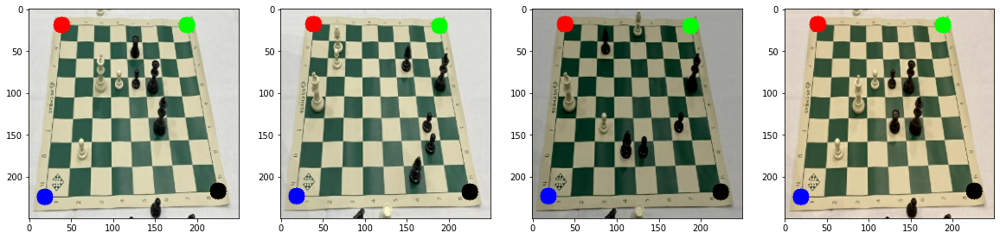

In [ ]:
fig, ax = plt.subplots(ncols=4, figsize=(20,20))
for idx in range(4): 
    sample_image = res[0][idx]
    sample_coords = res[1][0][idx]
    
    tk = 10
    cv2.circle(sample_image, tuple(np.multiply(sample_coords[:2], [250,250]).astype(int)), tk, (255,0,0), -1)
    cv2.circle(sample_image, tuple(np.multiply(sample_coords[2:4], [250,250]).astype(int)), tk, (0,255,0), -1)
    cv2.circle(sample_image, tuple(np.multiply(sample_coords[4:6], [250,250]).astype(int)), tk, (0,0,255), -1)
    cv2.circle(sample_image, tuple(np.multiply(sample_coords[6:], [250,250]).astype(int)), tk, (0,0,0), -1)

    ax[idx].imshow(sample_image)

## **Build Model**

***ResNet152V2*** is a variation of the ResNet152 architecture that was introduced in a paper by Kaiming He, Xiangyu Zhang, Shaoqing Ren, and Jian Sun in 2016. ResNet152V2 is a convolutional neural network (CNN) architecture that is designed for image classification tasks. It is a deep residual network that is trained on the ImageNet dataset, which consists of over 14 million images and more than 22,000 classes. The V2 in the name of the architecture refers to the fact that it is the second version of the ResNet152 architecture.

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Conv2D, Reshape, Dropout
from tensorflow.keras.applications import ResNet152V2

In [ ]:
input_layer = Input(shape=(250,250,3))
backbone = ResNet152V2(include_top=False, input_shape=(250,250,3))(input_layer)
cnn1 = Conv2D(512, 3, padding='same', activation='relu')(backbone)
cnn2 = Conv2D(512, 3, padding='same', activation='relu')(cnn1)
cnn3 = Conv2D(256, 3,2, padding='same', activation='relu')(cnn2)   # 256 Layers 3x3 stride=2 (condensing data)
cnn4 = Conv2D(256, 2,2, activation='relu')(cnn3)
cnn5 = Conv2D(8, 2, 2)(cnn4)  # (output 4 values)
reshape = Reshape((8,))(cnn5)

# Finally output 4 values
# step by step reducing
# add sigmoid to avoid getting negative values


In [ ]:
print(backbone)
print(cnn1)
print(cnn2)
print(cnn3)
print(cnn4)
print(reshape)

KerasTensor(type_spec=TensorSpec(shape=(None, 8, 8, 2048), dtype=tf.float32, name=None), name='resnet152v2/post_relu/Relu:0', description="created by layer 'resnet152v2'")
KerasTensor(type_spec=TensorSpec(shape=(None, 8, 8, 512), dtype=tf.float32, name=None), name='conv2d_15/Relu:0', description="created by layer 'conv2d_15'")
KerasTensor(type_spec=TensorSpec(shape=(None, 8, 8, 512), dtype=tf.float32, name=None), name='conv2d_16/Relu:0', description="created by layer 'conv2d_16'")
KerasTensor(type_spec=TensorSpec(shape=(None, 4, 4, 256), dtype=tf.float32, name=None), name='conv2d_17/Relu:0', description="created by layer 'conv2d_17'")
KerasTensor(type_spec=TensorSpec(shape=(None, 2, 2, 256), dtype=tf.float32, name=None), name='conv2d_18/Relu:0', description="created by layer 'conv2d_18'")
KerasTensor(type_spec=TensorSpec(shape=(None, 8), dtype=tf.float32, name=None), name='reshape_3/Reshape:0', description="created by layer 'reshape_3'")


In [ ]:
# sequential API
model = Sequential([
    Input(shape=(250,250,3)), 
    ResNet152V2(include_top=False, input_shape=(250,250,3)),
    Conv2D(512, 3, padding='same', activation='relu'),
    Conv2D(512, 3, padding='same', activation='relu'),
    Conv2D(256, 3, 2, padding='same', activation='relu'),
    Conv2D(256, 2, 2, activation='relu'),
    Dropout(0.05),
    Conv2D(8, 2, 2),
    Reshape((8,))
])

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet152v2 (Functional)    (None, 8, 8, 2048)        58331648  
                                                                 
 conv2d_20 (Conv2D)          (None, 8, 8, 512)         9437696   
                                                                 
 conv2d_21 (Conv2D)          (None, 8, 8, 512)         2359808   
                                                                 
 conv2d_22 (Conv2D)          (None, 4, 4, 256)         1179904   
                                                                 
 conv2d_23 (Conv2D)          (None, 2, 2, 256)         262400    
                                                                 
 dropout (Dropout)           (None, 2, 2, 256)         0         
                                                                 
 conv2d_24 (Conv2D)          (None, 1, 1, 8)           8

### Setup Losses and Optimizer

In [ ]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001, decay=0.0007)
loss = tf.keras.losses.MeanSquaredError()

#### Callbacks



```
Save best model depending on the validation Loss
Tensorboard Callback
Plot Results while model is Trainning
```



In [ ]:
from keras.callbacks import ModelCheckpoint

# tensorboard callback
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir="./logs")

# save_best_model_callback
save_best_model_checkpoint = ModelCheckpoint('model-{epoch:03d}.h5',monitor='val_loss',save_best_only=True,mode='auto')

In [ ]:
from tensorflow.keras import callbacks
class PredictionCallback(callbacks.Callback):
    def __init__(self, log_interval, *args, **kwargs):
        super().__init__(*args, **kwargs)
        #self.image_files = image_files
        self.log_interval = log_interval
    
    def on_epoch_end(self, epoch, logs=None):
        if epoch % self.log_interval == 0: 
          test_data = test.as_numpy_iterator()
          test_sample = test_data.next()
          yhat = model.predict(test_sample[0])
          fig, ax = plt.subplots(ncols=4, figsize=(20,20))
          for idx in range(4): 
              sample_image = test_sample[0][idx]
              sample_coords = yhat[idx]
              tk = 10
              cv2.circle(sample_image, tuple(np.multiply(sample_coords[:2], [250,250]).astype(int)), tk, (255,0,0), -1)
              cv2.circle(sample_image, tuple(np.multiply(sample_coords[2:4], [250,250]).astype(int)), tk, (0,255,0), -1)
              cv2.circle(sample_image, tuple(np.multiply(sample_coords[4:6], [250,250]).astype(int)), tk, (0,0,255), -1)
              cv2.circle(sample_image, tuple(np.multiply(sample_coords[6:], [250,250]).astype(int)), tk, (0,0,0), -1)
              
              ax[idx].imshow(sample_image)


In [ ]:
model.compile(optimizer, loss)

#### Sense Check predictions

In [ ]:
X, y = train.as_numpy_iterator().next()

In [ ]:
X.shape

(16, 250, 250, 3)

In [ ]:
scores = model.predict(X)

1/1 [==============================] - 11s 11s/step


In [ ]:
scores[0]

array([-0.35718027, -0.49442437,  0.00697468,  0.13178042, -1.0088505 ,
        0.9960486 , -0.14134812,  0.88074553], dtype=float32)

#### Train the Model

Epoch 1/100
5/5 [==============================] - 5s 942ms/step - loss: 0.0039 - val_loss: 21.2461
Epoch 2/100
5/5 [==============================] - 3s 620ms/step - loss: 0.0029 - val_loss: 10.5562
Epoch 3/100
5/5 [==============================] - 3s 627ms/step - loss: 0.0041 - val_loss: 8.3185
Epoch 4/100
5/5 [==============================] - 3s 627ms/step - loss: 0.0032 - val_loss: 4.9040
Epoch 5/100
5/5 [==============================] - 3s 625ms/step - loss: 0.0019 - val_loss: 3.1573
Epoch 6/100
1/1 [==============================] - 0s 42ms/step


5/5 [==============================] - 5s 944ms/step - loss: 0.0028 - val_loss: 3.3468
Epoch 7/100
5/5 [==============================] - 3s 636ms/step - loss: 0.0028 - val_loss: 2.1207
Epoch 8/100
5/5 [==============================] - 3s 633ms/step - loss: 0.0018 - val_loss: 1.6037
Epoch 9/100
5/5 [==============================] - 4s 732ms/step - loss: 0.0015 - val_loss: 1.2558
Epoch 10/100
5/5 [==============================] - 3s 635ms/step - loss: 0.0014 - val_loss: 1.0714
Epoch 11/100
1/1 [==============================] - 0s 46ms/step


5/5 [==============================] - 5s 950ms/step - loss: 0.0015 - val_loss: 0.9327
Epoch 12/100
5/5 [==============================] - 3s 634ms/step - loss: 0.0019 - val_loss: 0.5571
Epoch 13/100
5/5 [==============================] - 3s 640ms/step - loss: 0.0022 - val_loss: 0.5062
Epoch 14/100
5/5 [==============================] - 3s 633ms/step - loss: 0.0018 - val_loss: 0.4093
Epoch 15/100
5/5 [==============================] - 3s 639ms/step - loss: 0.0012 - val_loss: 0.2484
Epoch 16/100
1/1 [==============================] - 0s 41ms/step


5/5 [==============================] - 5s 942ms/step - loss: 0.0018 - val_loss: 0.2721
Epoch 17/100
5/5 [==============================] - 3s 629ms/step - loss: 0.0017 - val_loss: 0.2415
Epoch 18/100
5/5 [==============================] - 10s 2s/step - loss: 0.0023 - val_loss: 0.1469
Epoch 19/100
5/5 [==============================] - 12s 3s/step - loss: 0.0018 - val_loss: 0.1042
Epoch 20/100
5/5 [==============================] - 11s 2s/step - loss: 0.0014 - val_loss: 0.1032
Epoch 21/100
1/1 [==============================] - 0s 40ms/step


5/5 [==============================] - 4s 810ms/step - loss: 0.0017 - val_loss: 0.1093
Epoch 22/100
5/5 [==============================] - 11s 2s/step - loss: 0.0015 - val_loss: 0.0870
Epoch 23/100
5/5 [==============================] - 10s 2s/step - loss: 0.0015 - val_loss: 0.0436
Epoch 24/100
5/5 [==============================] - 11s 3s/step - loss: 0.0015 - val_loss: 0.0383
Epoch 25/100
5/5 [==============================] - 3s 650ms/step - loss: 0.0019 - val_loss: 0.1079
Epoch 26/100
1/1 [==============================] - 0s 55ms/step


5/5 [==============================] - 12s 3s/step - loss: 0.0040 - val_loss: 0.0287
Epoch 27/100
5/5 [==============================] - 3s 657ms/step - loss: 0.0014 - val_loss: 0.0332
Epoch 28/100
5/5 [==============================] - 3s 662ms/step - loss: 0.0017 - val_loss: 0.0324
Epoch 29/100
5/5 [==============================] - 4s 663ms/step - loss: 0.0021 - val_loss: 0.0856
Epoch 30/100
5/5 [==============================] - 10s 2s/step - loss: 0.0033 - val_loss: 0.0265
Epoch 31/100
1/1 [==============================] - 0s 71ms/step


5/5 [==============================] - 12s 3s/step - loss: 0.0016 - val_loss: 0.0254
Epoch 32/100
5/5 [==============================] - 4s 726ms/step - loss: 0.0017 - val_loss: 0.0458
Epoch 33/100
5/5 [==============================] - 4s 741ms/step - loss: 0.0016 - val_loss: 0.0266
Epoch 34/100
5/5 [==============================] - 9s 2s/step - loss: 0.0011 - val_loss: 0.0203
Epoch 35/100
5/5 [==============================] - 3s 630ms/step - loss: 0.0011 - val_loss: 0.0223
Epoch 36/100
1/1 [==============================] - 0s 69ms/step


5/5 [==============================] - 12s 3s/step - loss: 7.1514e-04 - val_loss: 0.0200
Epoch 37/100
5/5 [==============================] - 11s 2s/step - loss: 9.7102e-04 - val_loss: 0.0178
Epoch 38/100
5/5 [==============================] - 12s 3s/step - loss: 9.7389e-04 - val_loss: 0.0101
Epoch 39/100
5/5 [==============================] - 4s 674ms/step - loss: 0.0012 - val_loss: 0.0159
Epoch 40/100
5/5 [==============================] - 15s 4s/step - loss: 0.0014 - val_loss: 0.0054
Epoch 41/100
1/1 [==============================] - 0s 56ms/step


5/5 [==============================] - 12s 3s/step - loss: 0.0011 - val_loss: 0.0022
Epoch 42/100
5/5 [==============================] - 3s 661ms/step - loss: 0.0010 - val_loss: 0.0064
Epoch 43/100
5/5 [==============================] - 3s 635ms/step - loss: 0.0010 - val_loss: 0.0053
Epoch 44/100
5/5 [==============================] - 4s 645ms/step - loss: 0.0011 - val_loss: 0.0023
Epoch 45/100
5/5 [==============================] - 4s 741ms/step - loss: 8.9680e-04 - val_loss: 0.0038
Epoch 46/100
1/1 [==============================] - 0s 46ms/step


5/5 [==============================] - 6s 1s/step - loss: 8.8543e-04 - val_loss: 0.0039
Epoch 47/100
5/5 [==============================] - 9s 2s/step - loss: 0.0011 - val_loss: 3.4241e-04
Epoch 48/100
5/5 [==============================] - 3s 625ms/step - loss: 0.0014 - val_loss: 0.0014
Epoch 49/100
5/5 [==============================] - 3s 627ms/step - loss: 9.2997e-04 - val_loss: 4.7104e-04
Epoch 50/100
5/5 [==============================] - 3s 680ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 51/100
1/1 [==============================] - 0s 60ms/step


5/5 [==============================] - 7s 1s/step - loss: 8.8672e-04 - val_loss: 5.8912e-04
Epoch 52/100
5/5 [==============================] - 3s 630ms/step - loss: 9.7548e-04 - val_loss: 0.0017
Epoch 53/100
5/5 [==============================] - 3s 630ms/step - loss: 0.0011 - val_loss: 7.9867e-04
Epoch 54/100
5/5 [==============================] - 9s 2s/step - loss: 0.0012 - val_loss: 1.2342e-04
Epoch 55/100
5/5 [==============================] - 3s 626ms/step - loss: 0.0015 - val_loss: 0.0026
Epoch 56/100
1/1 [==============================] - 0s 59ms/step


5/5 [==============================] - 5s 987ms/step - loss: 8.2971e-04 - val_loss: 0.0036
Epoch 57/100
5/5 [==============================] - 3s 657ms/step - loss: 0.0012 - val_loss: 9.1690e-04
Epoch 58/100
5/5 [==============================] - 4s 738ms/step - loss: 6.4789e-04 - val_loss: 6.3221e-04
Epoch 59/100
5/5 [==============================] - 10s 2s/step - loss: 7.7565e-04 - val_loss: 1.1180e-04
Epoch 60/100
5/5 [==============================] - 3s 641ms/step - loss: 0.0014 - val_loss: 0.0012
Epoch 61/100
1/1 [==============================] - 0s 47ms/step


5/5 [==============================] - 5s 945ms/step - loss: 0.0012 - val_loss: 0.0015
Epoch 62/100
5/5 [==============================] - 4s 668ms/step - loss: 9.1850e-04 - val_loss: 0.0021
Epoch 63/100
5/5 [==============================] - 4s 664ms/step - loss: 0.0012 - val_loss: 3.4428e-04
Epoch 64/100
5/5 [==============================] - 9s 2s/step - loss: 0.0014 - val_loss: 6.1463e-05
Epoch 65/100
5/5 [==============================] - 3s 629ms/step - loss: 8.9981e-04 - val_loss: 0.0011
Epoch 66/100
1/1 [==============================] - 0s 45ms/step


5/5 [==============================] - 4s 791ms/step - loss: 0.0012 - val_loss: 0.0066
Epoch 67/100
5/5 [==============================] - 3s 672ms/step - loss: 0.0016 - val_loss: 0.0038
Epoch 68/100
5/5 [==============================] - 4s 668ms/step - loss: 0.0011 - val_loss: 1.8312e-04
Epoch 69/100
5/5 [==============================] - 4s 663ms/step - loss: 0.0013 - val_loss: 3.7068e-04
Epoch 70/100
5/5 [==============================] - 3s 639ms/step - loss: 0.0024 - val_loss: 0.0036
Epoch 71/100
1/1 [==============================] - 0s 49ms/step


5/5 [==============================] - 4s 806ms/step - loss: 0.0019 - val_loss: 0.0025
Epoch 72/100
5/5 [==============================] - 3s 635ms/step - loss: 8.2046e-04 - val_loss: 0.0017
Epoch 73/100
5/5 [==============================] - 3s 634ms/step - loss: 0.0010 - val_loss: 5.7995e-04
Epoch 74/100
5/5 [==============================] - 3s 665ms/step - loss: 9.2064e-04 - val_loss: 8.2345e-05
Epoch 75/100
5/5 [==============================] - 4s 633ms/step - loss: 0.0011 - val_loss: 0.0024
Epoch 76/100
1/1 [==============================] - 0s 42ms/step


5/5 [==============================] - 5s 948ms/step - loss: 6.5242e-04 - val_loss: 0.0023
Epoch 77/100
5/5 [==============================] - 3s 629ms/step - loss: 8.0690e-04 - val_loss: 3.5539e-04
Epoch 78/100
5/5 [==============================] - 3s 631ms/step - loss: 9.0544e-04 - val_loss: 8.9481e-04
Epoch 79/100
5/5 [==============================] - 3s 635ms/step - loss: 7.0928e-04 - val_loss: 4.2369e-04
Epoch 80/100
5/5 [==============================] - 3s 626ms/step - loss: 6.9589e-04 - val_loss: 2.2891e-04
Epoch 81/100
1/1 [==============================] - 0s 43ms/step


5/5 [==============================] - 4s 769ms/step - loss: 0.0011 - val_loss: 2.8367e-04
Epoch 82/100
5/5 [==============================] - 3s 634ms/step - loss: 0.0013 - val_loss: 0.0038
Epoch 83/100
5/5 [==============================] - 3s 634ms/step - loss: 0.0016 - val_loss: 5.0448e-04
Epoch 84/100
5/5 [==============================] - 3s 635ms/step - loss: 0.0012 - val_loss: 0.0016
Epoch 85/100
5/5 [==============================] - 3s 630ms/step - loss: 0.0019 - val_loss: 3.0340e-04
Epoch 86/100
1/1 [==============================] - 0s 52ms/step


5/5 [==============================] - 4s 768ms/step - loss: 0.0020 - val_loss: 0.0042
Epoch 87/100
5/5 [==============================] - 3s 637ms/step - loss: 0.0019 - val_loss: 3.5359e-04
Epoch 88/100
5/5 [==============================] - 3s 633ms/step - loss: 0.0010 - val_loss: 0.0013
Epoch 89/100
5/5 [==============================] - 3s 628ms/step - loss: 0.0021 - val_loss: 0.0069
Epoch 90/100
5/5 [==============================] - 3s 624ms/step - loss: 0.0032 - val_loss: 5.9963e-04
Epoch 91/100
1/1 [==============================] - 0s 40ms/step


5/5 [==============================] - 5s 943ms/step - loss: 0.0021 - val_loss: 4.4065e-04
Epoch 92/100
5/5 [==============================] - 3s 628ms/step - loss: 0.0023 - val_loss: 0.0016
Epoch 93/100
5/5 [==============================] - 3s 630ms/step - loss: 0.0011 - val_loss: 2.4582e-04
Epoch 94/100
5/5 [==============================] - 3s 630ms/step - loss: 6.4741e-04 - val_loss: 0.0039
Epoch 95/100
5/5 [==============================] - 3s 635ms/step - loss: 0.0017 - val_loss: 2.3577e-04
Epoch 96/100
1/1 [==============================] - 0s 46ms/step


5/5 [==============================] - 5s 947ms/step - loss: 0.0016 - val_loss: 2.7365e-04
Epoch 97/100
5/5 [==============================] - 3s 628ms/step - loss: 8.8883e-04 - val_loss: 0.0052
Epoch 98/100
5/5 [==============================] - 3s 632ms/step - loss: 0.0015 - val_loss: 1.3995e-04
Epoch 99/100
5/5 [==============================] - 3s 630ms/step - loss: 9.6969e-04 - val_loss: 0.0021
Epoch 100/100
5/5 [==============================] - 3s 636ms/step - loss: 0.0011 - val_loss: 0.0028


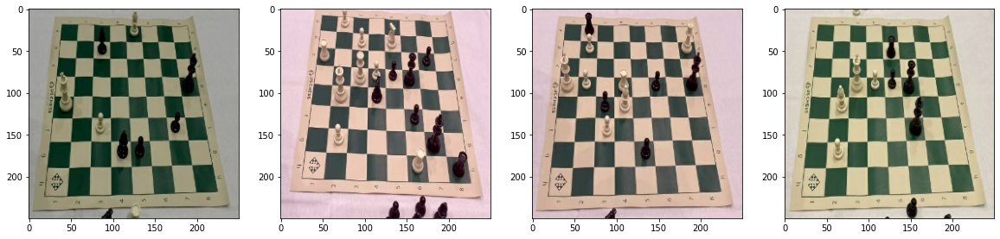

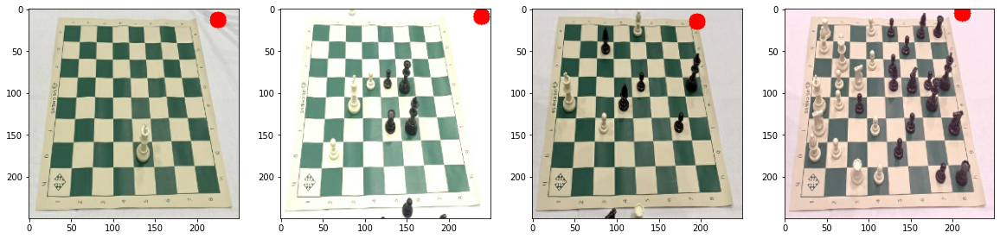

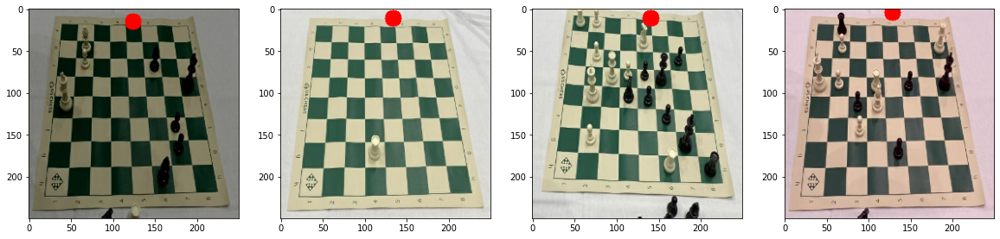

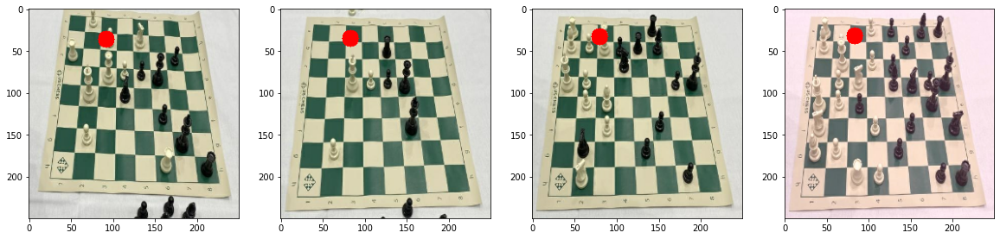

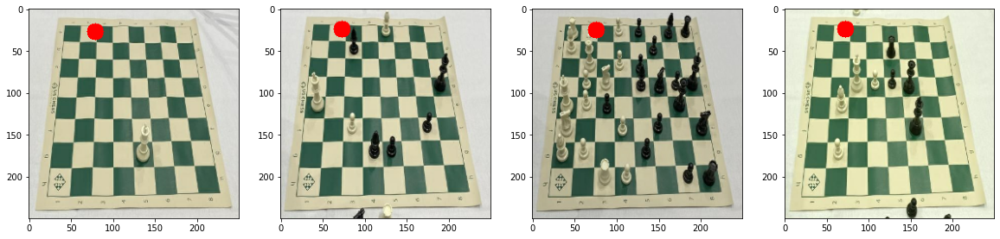

...

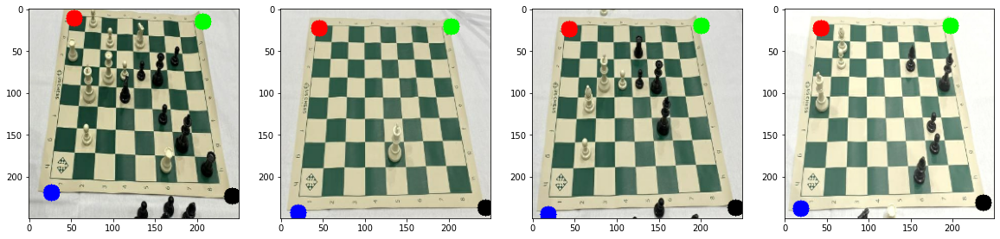

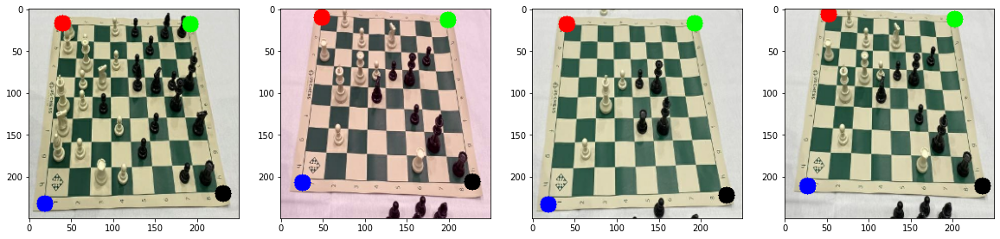

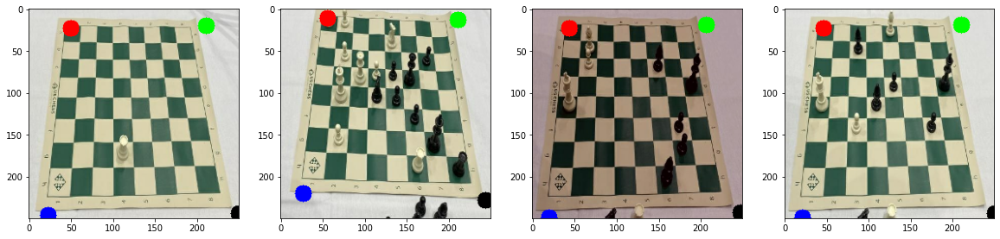

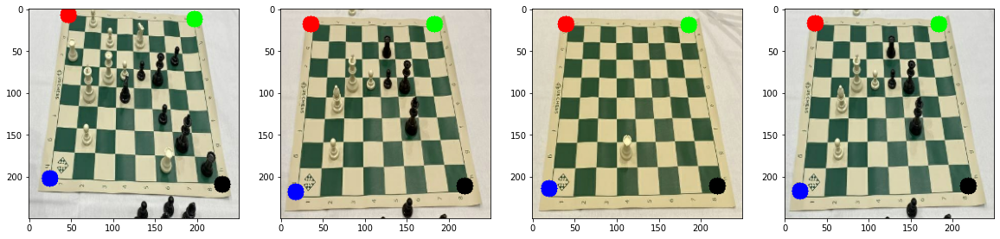

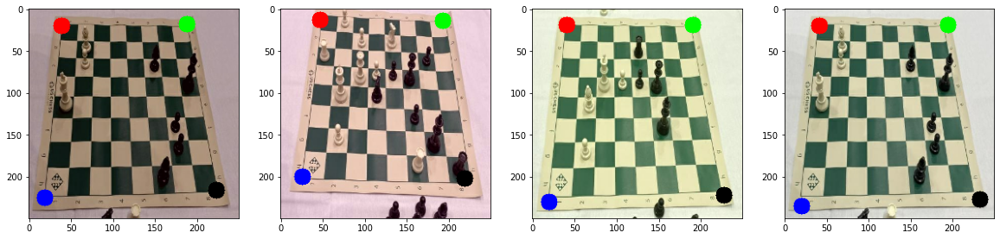

In [ ]:
LOG_INTERVALS = 5
EPOCHS = 100
# Train for 100 epochs
hist = model.fit(train, epochs=EPOCHS, validation_data=val,callbacks=[tensorboard_callback,save_best_model_checkpoint,
                                                                                PredictionCallback(log_interval = LOG_INTERVALS)])

#### Review Performance

In [ ]:
#hist.history

{'loss': [0.0038594380021095276,
  0.002883116016164422,
  0.00406978465616703,
  0.003161529777571559,
  0.0018923927564173937,
  0.002807391108945012,
  0.002772956620901823,
  0.0017560016131028533,
  0.0014717531157657504,
  0.001444152439944446,
  0.0014612703816965222,
  0.0019217694643884897,
  0.0021983508486300707,
  0.0017619378631934524,
  0.0012350042816251516,
  0.0017699961317703128,
  0.0017165649915114045,
  0.0022836774587631226,
  0.0018244687234982848,
  0.001424766960553825,
  0.0017207209020853043,
  0.0014652772806584835,
  0.0014944598078727722,
  0.0014899122761562467,
  0.001873464323580265,
  0.003966519609093666,
  0.001403335016220808,
  0.001744820037856698,
  0.0020941353868693113,
  0.003309287130832672,
  0.0015767093282192945,
  0.0016567077254876494,
  0.0016385357594117522,
  0.0011228962102904916,
  0.001053758547641337,
  0.0007151378085836768,
  0.0009710156009532511,
  0.0009738905937410891,
  0.0011921111727133393,
  0.0013759031426161528,
  0.00

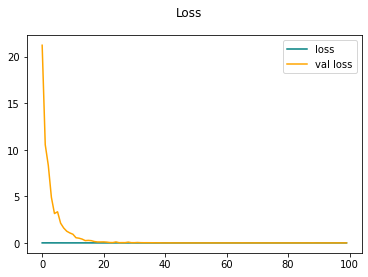

In [ ]:
plt.plot(hist.history['loss'], color='teal', label='loss')
plt.plot(hist.history['val_loss'], color='orange', label='val loss')
plt.suptitle('Loss')
plt.legend()
plt.show()

In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir './logs'

<IPython.core.display.Javascript object>

#### Make Predictions on Test

In [ ]:
test_data = test.as_numpy_iterator()

In [ ]:
test_sample = test_data.next()

In [ ]:
yhat = model.predict(test_sample[0])

1/1 [==============================] - 0s 47ms/step


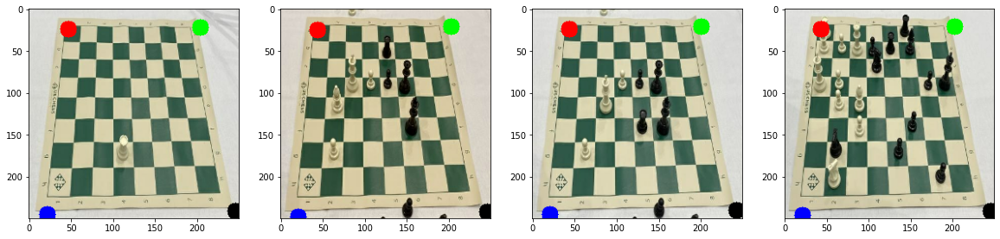

In [ ]:
fig, ax = plt.subplots(ncols=4, figsize=(20,20))
for idx in range(4): 
    sample_image = test_sample[0][idx]
    sample_coords = yhat[idx]

    tk = 10
    cv2.circle(sample_image, tuple(np.multiply(sample_coords[:2], [250,250]).astype(int)), tk, (255,0,0), -1)
    cv2.circle(sample_image, tuple(np.multiply(sample_coords[2:4], [250,250]).astype(int)), tk, (0,255,0), -1)
    cv2.circle(sample_image, tuple(np.multiply(sample_coords[4:6], [250,250]).astype(int)), tk, (0,0,255), -1)
    cv2.circle(sample_image, tuple(np.multiply(sample_coords[6:], [250,250]).astype(int)), tk, (0,0,0), -1)

    ax[idx].imshow(sample_image)

### 4.3. Save the Model

In [ ]:
from tensorflow.keras.models import load_model

In [ ]:
model.save('Model_detectCorners.h5')

In [ ]:
model = load_model('Model_detectCorners.h5')

In [ ]:
model.predict(test_sample[0])

1/1 [==============================] - 3s 3s/step


array([[ 5.7605228e+01, -1.5278869e+01,  1.6216286e+02, -1.5026741e+00,
         4.1652538e+01,  1.8146037e+02,  1.7285606e+02,  1.6655737e+02],
       [ 5.2278198e+01, -1.4473697e+01,  1.5127631e+02, -1.7235820e+00,
         3.6562382e+01,  1.7449327e+02,  1.6500620e+02,  1.5662090e+02],
       [ 5.7470074e+01, -1.5985720e+01,  1.5962515e+02, -2.0258310e+00,
         4.0311260e+01,  1.8111995e+02,  1.7050777e+02,  1.6281987e+02],
       [ 5.5696373e+01, -1.4603105e+01,  1.5657567e+02, -1.5833749e+00,
         3.9113506e+01,  1.7896080e+02,  1.6874461e+02,  1.6082559e+02],
       [ 2.0554502e-01,  4.9970653e-02,  8.0964774e-01,  5.8638137e-02,
         1.0446708e-01,  8.6851019e-01,  9.5411927e-01,  8.9198625e-01],
       [ 1.8884425e-01,  9.9814214e-02,  8.1371886e-01,  9.1068171e-02,
         9.1040626e-02,  9.8231143e-01,  9.8402363e-01,  9.6546513e-01],
       [ 1.7107444e-01,  9.6474715e-02,  7.9971200e-01,  8.4177576e-02,
         7.8659251e-02,  9.8437977e-01,  9.7205794e-01,  9

In [ ]:
# cap = cv2.VideoCapture(0)
# while cap.isOpened():
#     _ , frame = cap.read()
    
#     frame = frame[50:500,50:500,:] 
#     rgb_img = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
#     resized = cv2.resize(rgb_img, (250,250))
    
#     yhat = model.predict(np.expand_dims(resized/255,0))
#     sample_coords = yhat[0,:4]
    
#     cv2.circle(frame, tuple(np.multiply(sample_coords[:2], [450,450]).astype(int)), 2, (255,0,0), -1)
#     cv2.circle(frame, tuple(np.multiply(sample_coords[2:], [450,450]).astype(int)), 2, (0,255,0), -1)
    
#     cv2.imshow('EyeTrack', frame)
    
#     if cv2.waitKey(1) & 0xFF == ord('q'):
#         break
# cap.release()
# cv2.destroyAllWindows()